In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('C://Users//jha9001//OneDrive - The Nielsen Company//Desktop//Learn//New folder//Datatrained_PG_DSci//FlipRobo//assignment 4//Copy of customer_retention_dataset.csv',encoding='latin')

In [3]:
data.head()

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,...,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent
0,0,3,Delhi,110009,5,4,4,3,5,1,...,5,3,3,2,3,4,4,5,4,5
1,1,2,Delhi,110030,5,5,2,1,2,3,...,5,5,5,5,3,3,3,5,5,5
2,1,2,Greater Noida,201308,4,5,3,1,4,2,...,4,5,5,5,4,4,4,3,3,4
3,0,2,Karnal,132001,4,1,3,1,4,3,...,4,4,4,5,4,4,5,4,3,4
4,1,2,Bangalore,530068,3,2,2,1,2,3,...,5,4,4,5,4,3,1,5,1,5


In [4]:
data.shape

(269, 47)

In [5]:
data.isna().sum()

1Gender of respondent                                                                                                                                                                                                  0
2 How old are you?                                                                                                                                                                                                     0
3 Which city do you shop online from?                                                                                                                                                                                  0
4 What is the Pin Code of where you shop online from?                                                                                                                                                                  0
5 Since How Long You are Shopping Online ?                                                                                          

In [6]:
data.describe()

,1Gender of respondent,2 How old are you?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,...,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,...,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000
mean,0.669145,2.959108,220465.747212,3.524164,2.672862,3.260223,1.676580,4.282528,1.776952,1.275093,...,4.182156,4.148699,4.349442,4.263941,3.914498,3.553903,3.223048,3.501859,3.282528,4.163569
std,0.471398,1.066012,140524.341051,1.436586,1.651788,1.135887,0.843904,0.923426,0.797892,0.645429,...,1.072162,0.842110,0.755953,1.000485,0.693879,1.065869,1.219581,1.141564,1.178995,0.648773
min,0.000000,1.000000,110008.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,...,1.000000,2.000000,2.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,3.000000
25%,0.000000,2.000000,122018.000000,3.000000,1.000000,2.000000,1.000000,4.000000,1.000000,1.000000,...,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000
50%,1.000000,3.000000,201303.000000,4.000000,2.000000,3.000000,1.000000,4.000000,2.000000,1.000000,...,4.000000,4.000000,5.000000,5.000000,4.000000,4.000000,3.000000,3.000000,3.000000,4.000000
75%,1.000000,4.000000,201310.000000,5.000000,4.000000,5.000000,2.000000,5.000000,2.000000,1.000000,...,5.000000,5.000000,5.000000,5.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000
max,1.000000,5.000000,560037.000000,5.000000,5.000000,5.000000,4.000000,5.000000,3.000000,4.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 47 columns):
 #   Column                                                                                                                                                                                                          Non-Null Count  Dtype 
---  ------                                                                                                                                                                                                          --------------  ----- 
 0   1Gender of respondent                                                                                                                                                                                           269 non-null    int64 
 1   2 How old are you?                                                                                                                                                                    

In [8]:
data = data.drop(columns = ['4 What is the Pin Code of where you shop online from?'])
data.head()

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,...,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent
0,0,3,Delhi,5,4,4,3,5,1,1,...,5,3,3,2,3,4,4,5,4,5
1,1,2,Delhi,5,5,2,1,2,3,1,...,5,5,5,5,3,3,3,5,5,5
2,1,2,Greater Noida,4,5,3,1,4,2,1,...,4,5,5,5,4,4,4,3,3,4
3,0,2,Karnal,4,1,3,1,4,3,2,...,4,4,4,5,4,4,5,4,3,4
4,1,2,Bangalore,3,2,2,1,2,3,2,...,5,4,4,5,4,3,1,5,1,5


In [9]:
data['3 Which city do you shop online from?'].unique()

array(['Delhi', 'Greater Noida', 'Karnal ', 'Bangalore ', 'Noida',
       'Solan', 'Moradabad', 'Gurgaon ', 'Merrut', 'Ghaziabad',
       'Bulandshahr'], dtype=object)

In [10]:
from sklearn.preprocessing import OrdinalEncoder

In [11]:
Ordinal_encoder = OrdinalEncoder(categories=[['Delhi', 'Greater Noida', 'Karnal ', 'Bangalore ', 'Noida',
       'Solan', 'Moradabad', 'Gurgaon ', 'Merrut', 'Ghaziabad',
       'Bulandshahr']])
Ordinal_encoded = Ordinal_encoder.fit_transform(data[['3 Which city do you shop online from?']])
Ordinal_encoded

array([[ 0.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 0.],
       [ 5.],
       [ 0.],
       [ 6.],
       [ 4.],
       [ 7.],
       [ 1.],
       [ 2.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 0.],
       [ 5.],
       [ 4.],
       [ 7.],
       [ 1.],
       [ 1.],
       [ 8.],
       [ 3.],
       [ 9.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 1.],
       [ 8.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 1.],
       [ 8.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 1.],
       [ 8.],
       [ 3.],
       [ 4.],
       [ 0.],
       [ 1.],
       [ 8.],
       [ 3.],
      

In [12]:
data['3 Which city do you shop online from?']=Ordinal_encoded

In [13]:
data.head()

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,...,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent
0,0,3,0.0,5,4,4,3,5,1,1,...,5,3,3,2,3,4,4,5,4,5
1,1,2,0.0,5,5,2,1,2,3,1,...,5,5,5,5,3,3,3,5,5,5
2,1,2,1.0,4,5,3,1,4,2,1,...,4,5,5,5,4,4,4,3,3,4
3,0,2,2.0,4,1,3,1,4,3,2,...,4,4,4,5,4,4,5,4,3,4
4,1,2,3.0,3,2,2,1,2,3,2,...,5,4,4,5,4,3,1,5,1,5


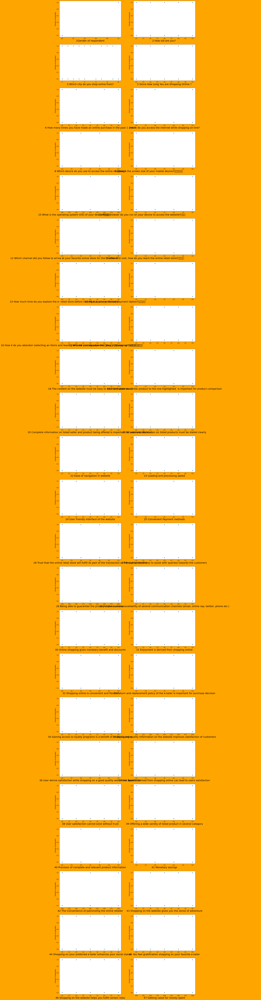

In [14]:
plt.figure(figsize=(20,150),facecolor='orange',)
plotnumber = 1


for column in data:
    if plotnumber<=46:
        ax=plt.subplot(23,2,plotnumber)
        sns.scatterplot(data[column],data['1Gender of respondent'])
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

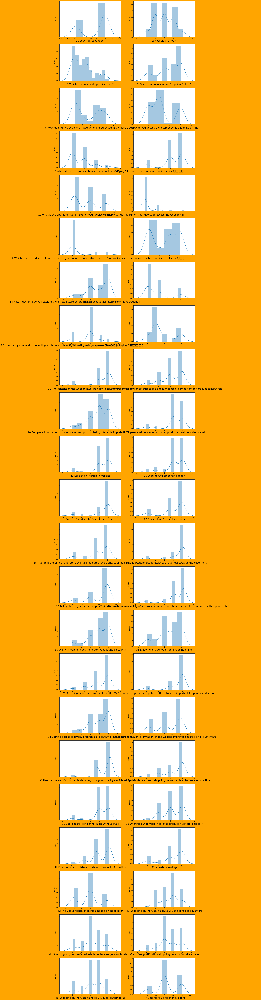

In [20]:
plt.figure(figsize=(20,150),facecolor='orange',)
plotnumber = 1


for column in data:
    if plotnumber<=46:
        ax=plt.subplot(23,2,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

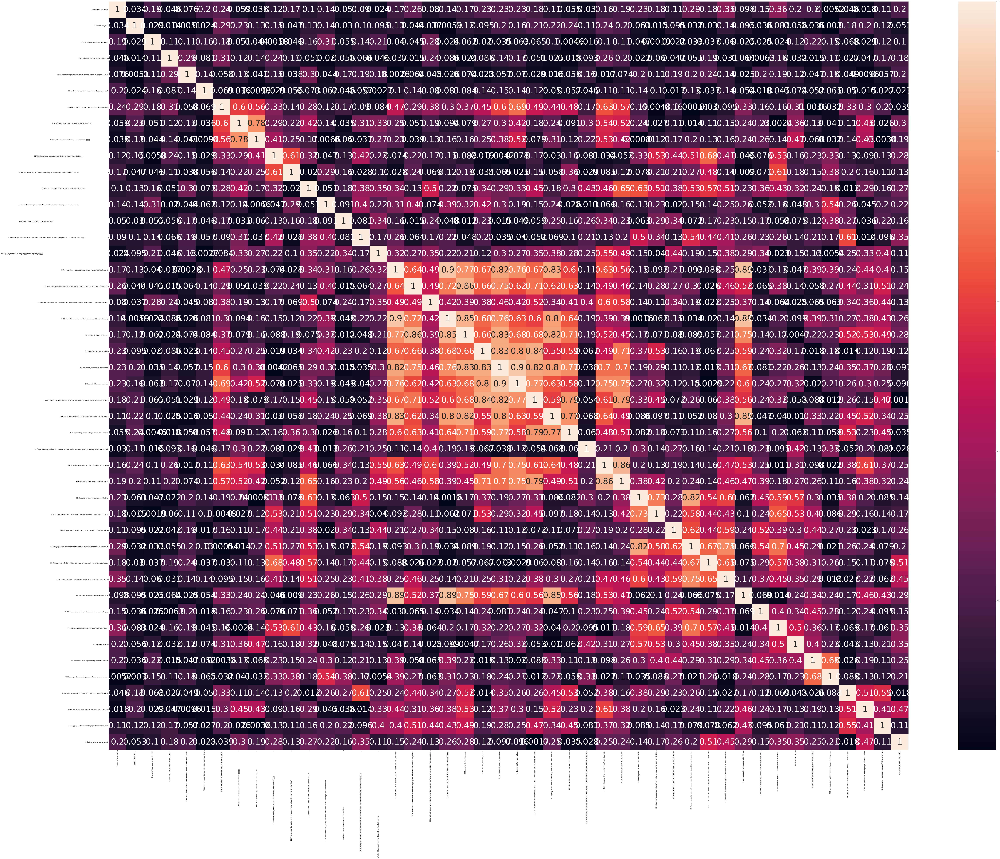

In [23]:
df_corr = data.corr().abs()  #this will calculate the co-effient between the features

plt.figure(figsize =(130, 100))
sns.heatmap(df_corr, annot = True, annot_kws={'size' :60})
plt.show()

In [ ]:
label =